In [3]:
# autoreload stuff if needed
import os
if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")

In [4]:
from pathlib import Path
import plotly.express as px
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
import numpy as np
import pandas as pd
import seaborn as sns

ModuleNotFoundError: No module named 'plotly'

# Load and clean data

In [1]:
data_dir = Path("data")
water_level_dir = data_dir / "ReservoirWatchHac k" / "Data" / "CWC_WaterLevels"
water_level_files = [
    water_level_dir / fname
    for fname in [
        "Harangi.csv",
        "Hemavathi.csv",
        "kabini.csv",
        "KRS.csv"
    ]
]

# read in csv handling some messy data points:
# HARANGI-2015-01-17: empty value
# 2014-05-15: weird character
water_level_df = pd.concat([pd.read_csv(fpath, parse_dates=["FLOW_DATE"], na_values=[" ", "&nbsp;"]) for fpath in water_level_files], ignore_index=True)
water_level_df.columns = water_level_df.columns.str.lower()

# KABINI-2011-04-11: large value
water_level_df.loc[(water_level_df["reservoir"] == "Kabini") & (water_level_df["res_level_ft"] >= 2800), "res_level_ft"] = np.NaN

# forward fills based on column (keeping original column) need to set index and then reset index
water_level_df = water_level_df.set_index("reservoir").groupby("reservoir").ffill().reset_index()

# augment data
water_level_df["netflow_cuecs"] = water_level_df["outflow_cuecs"] - water_level_df["inflow_cusecs"]


print(water_level_df.dtypes)
water_level_df


NameError: name 'Path' is not defined

In [29]:
# some descriptions of the data per-reservoir
water_level_df.groupby("reservoir").describe().transpose()

reservoir                 Harangi     Hemavathi          K.R.S        Kabini
sl_no         count   3321.000000   3314.000000    3313.000000   3314.000000
              mean   22260.781391  22231.489137   22243.906731  22281.950513
              std    12776.309856  12763.731821   12762.354003  12712.048863
              min       37.000000     44.000000      51.000000    226.000000
              25%    11031.000000  11064.250000   11135.000000  11078.250000
...                           ...           ...            ...           ...
netflow_cuecs min   -17225.000000 -58140.000000 -130298.000000 -33959.000000
              25%     -126.000000   -120.000000    -356.000000   -286.000000
              50%      -22.000000    150.000000     275.000000    281.500000
              75%      525.000000   1851.500000    2485.000000    854.000000
              max    11810.000000  12064.000000   78268.000000  42326.300000

[64 rows x 4 columns]

In [57]:
melted_water_df = water_level_df.melt(
    id_vars=["sl_no", "reservoir", "year", "week_no", "flow_date", "unique_key"], 
    var_name="metric",
)
melted_water_df = melted_water_df.sort_values(["reservoir", "flow_date", "metric"])
melted_water_df

,sl_no,reservoir,year,week_no,flow_date,unique_key,metric,value
27466,13060,Harangi,2010,39,2010-09-30,HARANGI-2010-09-30,inflow_cusecs,408.00
53990,13060,Harangi,2010,39,2010-09-30,HARANGI-2010-09-30,netflow_cuecs,-408.00
40728,13060,Harangi,2010,39,2010-09-30,HARANGI-2010-09-30,outflow_cuecs,0.00
942,13060,Harangi,2010,39,2010-09-30,HARANGI-2010-09-30,present_storage_tmc,8.17
14204,13060,Harangi,2010,39,2010-09-30,HARANGI-2010-09-30,res_level_ft,2858.02
...,...,...,...,...,...,...,...,...
36472,43926,Kabini,2020,50,2020-12-16,KABINI-2020-12-16,inflow_cusecs,503.00
62996,43926,Kabini,2020,50,2020-12-16,KABINI-2020-12-16,netflow_cuecs,172.00
49734,43926,Kabini,2020,50,2020-12-16,KABINI-2020-12-16,outflow_cuecs,675.00
9948,43926,Kabini,2020,50,2020-12-16,KABINI-2020-12-16,present_storage_tmc,12.37


In [58]:
melted_water_df[(melted_water_df["reservoir"] == "Kabini") & (melted_water_df["metric"] == "res_level_ft")]['value'].max()

2284.0

# Plot data

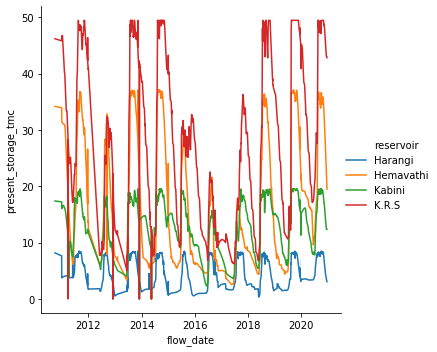

In [59]:
sns.relplot(
    data=water_level_df,
    x="flow_date",
    y="present_storage_tmc",
    hue="reservoir",
    kind="line",
#     row="reservoir",
    
)

In [60]:
def rows_with_max_on_col(df, col):
    idxs = df[col] == df[col].max()
    return df[idxs]

In [61]:
rows_with_max_on_col(water_level_df[water_level_df["reservoir"] == "Harangi"], "inflow_cusecs")

,reservoir,sl_no,year,week_no,flow_date,present_storage_tmc,res_level_ft,inflow_cusecs,outflow_cuecs,unique_key,netflow_cuecs
1284,Harangi,17626,2018,33,2018-08-17,7.1,2854.87,77900.0,78589.0,HARANGI-2018-08-17,689.0


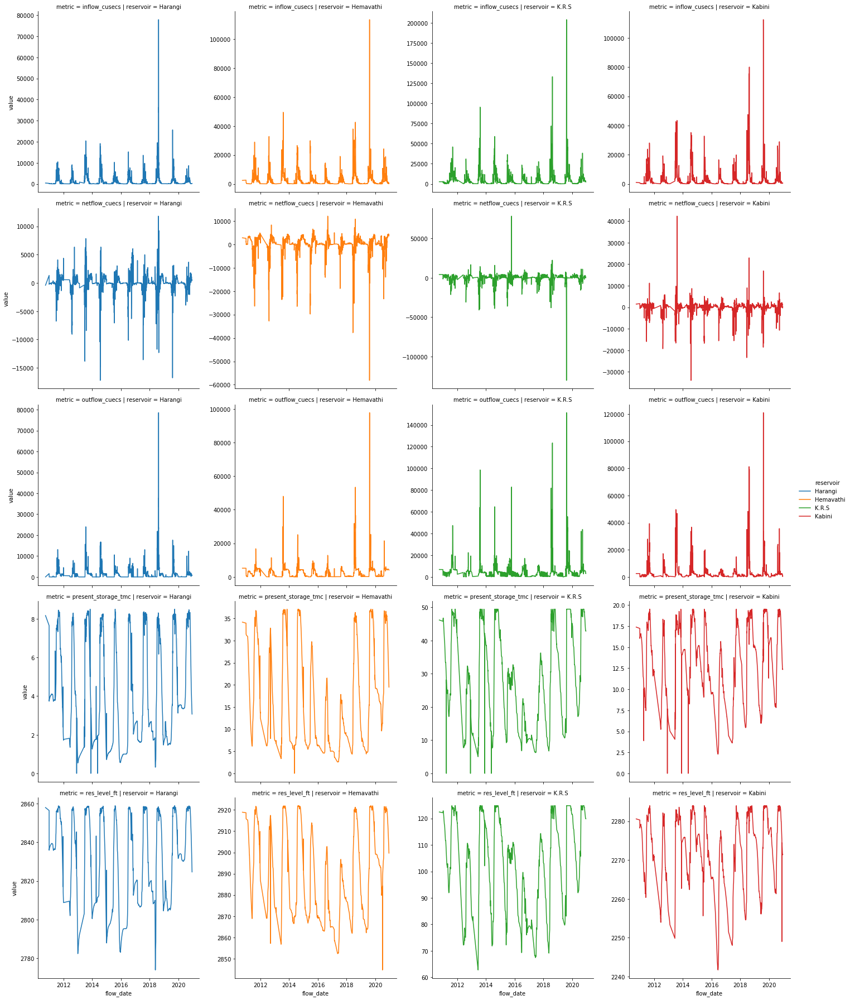

In [65]:
sns.relplot(
    data=melted_water_df,
    x="flow_date",
    y="value",
    hue="reservoir",
    kind="line",
    row="metric",
    col="reservoir",
    facet_kws={"sharey": False}
)

## Interactive plots with plotly

In [74]:

fig = px.line(
    data_frame=melted_water_df,
    x="flow_date",
    y="value",
    facet_row="metric",
    facet_col="reservoir",
)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)
fig.show()

In [73]:
fig = px.line(
    data_frame=melted_water_df,
    x="flow_date",
    y="value",
    facet_row="metric",
    facet_col="reservoir",
    facet_row_spacing=0.02, # default is 0.07 when facet_col_wrap is used
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(matches=None, type="log")

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)
fig.show()


# Try using facebook prophet

In [37]:
# prep data
prediction_df = water_level_df[water_level_df['reservoir'] == "Harangi"].copy()
# let's try using facebook prophet for harangi first
prediction_df["ds"] = prediction_df["flow_date"]
prediction_df['y'] = prediction_df['present_storage_tmc']
prediction_df["cap"] = prediction_df["present_storage_tmc"].max()

In [38]:
model = Prophet(
    growth="flat",
    seasonality_mode="multiplicative",
    daily_seasonality=False,
    weekly_seasonality=False,
    changepoint_prior_scale=0.01
)

In [39]:
model.fit(prediction_df)

In [40]:
future = model.make_future_dataframe(periods=3*365)
forecast = model.predict(future)

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
4407,2023-12-12,2.384175,0.734321,4.048985
4408,2023-12-13,2.327100,0.792875,3.864601
4409,2023-12-14,2.271924,0.749907,3.851535
4410,2023-12-15,2.219110,0.585248,3.736930
4411,2023-12-16,2.169114,0.671601,3.807315


In [41]:
plot_plotly(model, forecast)

In [42]:
plot_components_plotly(model, forecast)

## Add cross validation

In [43]:
from prophet.diagnostics import cross_validation
from prophet.plot import plot_cross_validation_metric
df_cv = cross_validation(model, initial='730 days', period='365 days', horizon = '90 days')

INFO:prophet:Making 8 forecasts with cutoffs between 2013-09-19 00:00:00 and 2020-09-17 00:00:00


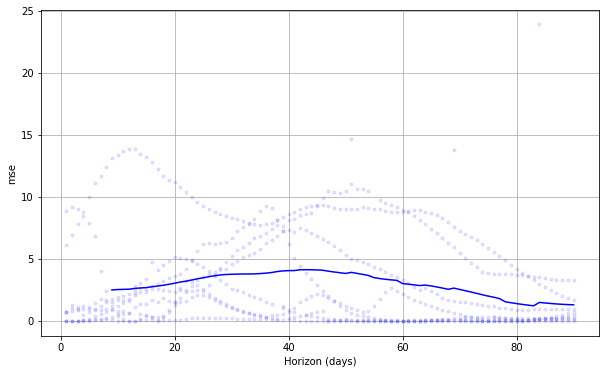

In [44]:
fig = plot_cross_validation_metric(df_cv, metric='mse')